# **Import libraries**

In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm,f_oneway
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from scipy.stats import chi2_contingency

In [ ]:
def choosing_the_K(data):
  copy_data=data.copy()
  # Step 2: Perform K-means clustering k=10
  inertia_=[]
  # data normalization
  sc_data=MinMaxScaler()
  sc_data=sc_data.fit_transform(copy_data)
   #step 3 choosing the k
  for k in range(1,11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(sc_data)
    inertia_.append(kmeans.inertia_)

    #step 3 choosing the k
  plt.plot(range(1,11),inertia_)

In [ ]:
def New_feature_by_Clustering(df,k):
  copy_data=df.copy()
  sc_data=MinMaxScaler()
  sc_data=sc_data.fit_transform(copy_data)
  kmeans = KMeans(n_clusters=k)
  kmeans.fit(sc_data)
  copy_data['Clone_Group']=kmeans.labels
  return copy_data

# **Reading files & making slight adjustments**

In [ ]:
df_Analyze=pd.read_csv('merged_data_with_full_names_updated.csv')

In [ ]:
df_Analyze.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3861 entries, 0 to 3860
Data columns (total 26 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Clone name + Refcode        3861 non-null   object 
 1   Number bean                 3420 non-null   float64
 2   Total wet weight bean       2000 non-null   float64
 3   Cotyledon dry weight bean   2606 non-null   float64
 4   Cotyledon length bean       2473 non-null   float64
 5   Cotyledon width bean        2473 non-null   float64
 6   Shape bean                  2135 non-null   object 
 7   Colour bean                 2012 non-null   object 
 8   Self compatibility flower   1445 non-null   object 
 9   Ovule number flower         2147 non-null   float64
 10  Ligule colour flower        2667 non-null   object 
 11  Stamen colour flower        2547 non-null   object 
 12  Sepal length flower         2615 non-null   float64
 13  Ligule width flower         2615 

# **EDA: Correlations & Statistical Tests (before dealing with outliers & replacing missing values)**

## **Correlations**

                            Number bean  Total wet weight bean  \
Number bean                    1.000000               0.261420   
Total wet weight bean          0.261420               1.000000   
Cotyledon dry weight bean     -0.257170               0.725780   
Cotyledon length bean         -0.084363               0.733027   
Cotyledon width bean          -0.236720               0.550056   
Ovule number flower            0.457610               0.085342   
Sepal length flower           -0.141069               0.262620   
Ligule width flower           -0.012348               0.243318   
Style length flower            0.018840               0.029892   
Length fruit                   0.118619               0.506776   
Breadth fruit                  0.009643               0.605999   
Weight fruit                   0.306204               0.355965   
Length breadth ratio fruit    -0.010245               0.026243   

                            Cotyledon dry weight bean  Cotyledon length bea

<ipython-input-6-3e6f45282f6f>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df_Analyze.corr()


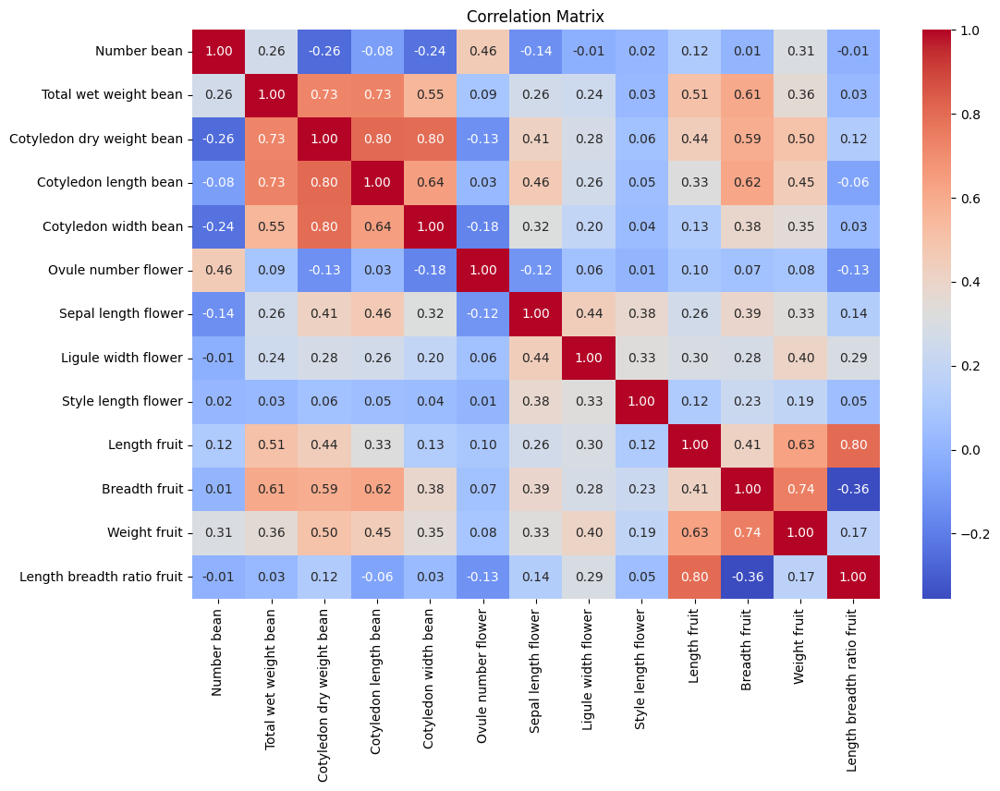

In [ ]:
correlation_matrix = df_Analyze.corr()

# Display the correlation matrix
print(correlation_matrix)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

plt.title('Correlation Matrix')
plt.show()

According to correlations that seems interesting and the perhaps could provide meaningful insights, we're gonna display scatter plots of some of the columns pairs:

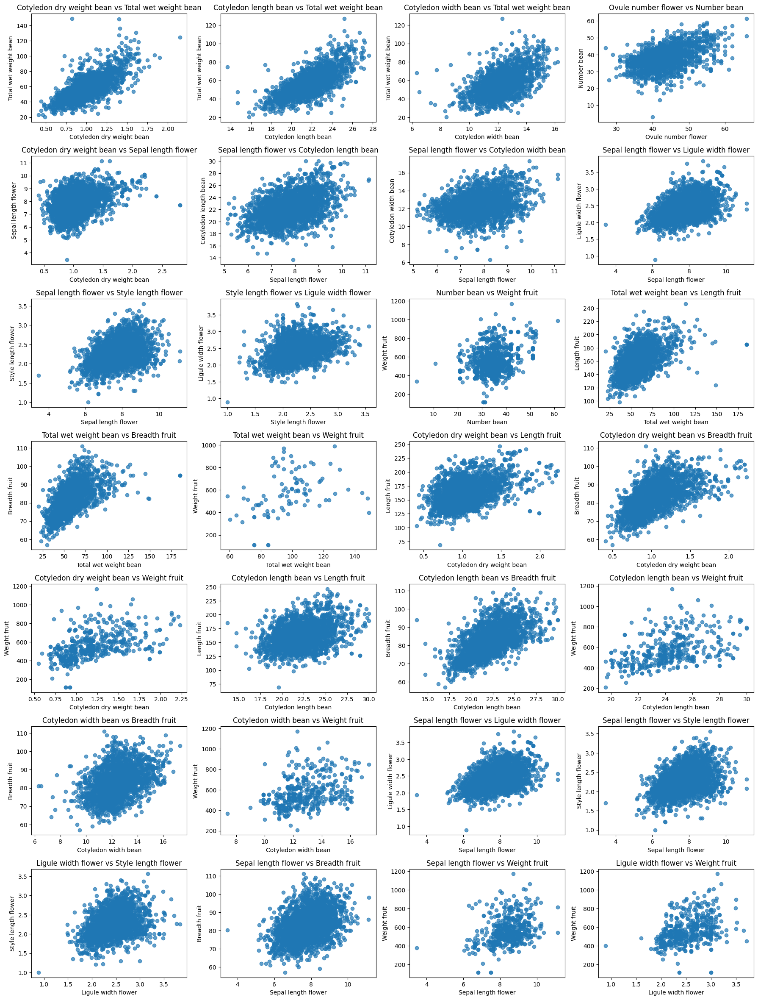

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 30))

pairs = [
    ('Cotyledon dry weight bean', 'Total wet weight bean'),
    ('Cotyledon length bean', 'Total wet weight bean'),
    ('Cotyledon width bean', 'Total wet weight bean'),
    ('Ovule number flower', 'Number bean'),
    ('Cotyledon dry weight bean', 'Sepal length flower'),
    ('Sepal length flower', 'Cotyledon length bean'),
    ('Sepal length flower', 'Cotyledon width bean'),
    ('Sepal length flower', 'Ligule width flower'),
    ('Sepal length flower', 'Style length flower'),
    ('Style length flower', 'Ligule width flower'),
    ('Number bean', 'Weight fruit'),
    ('Total wet weight bean', 'Length fruit'),
    ('Total wet weight bean', 'Breadth fruit'),
    ('Total wet weight bean', 'Weight fruit'),
    ('Cotyledon dry weight bean', 'Length fruit'),
    ('Cotyledon dry weight bean', 'Breadth fruit'),
    ('Cotyledon dry weight bean', 'Weight fruit'),
    ('Cotyledon length bean', 'Length fruit'),
    ('Cotyledon length bean', 'Breadth fruit'),
    ('Cotyledon length bean', 'Weight fruit'),
    ('Cotyledon width bean', 'Breadth fruit'),
    ('Cotyledon width bean', 'Weight fruit'),
    ('Sepal length flower', 'Ligule width flower'),
    ('Sepal length flower', 'Style length flower'),
    ('Ligule width flower', 'Style length flower'),
    ('Sepal length flower', 'Breadth fruit'),
    ('Sepal length flower', 'Weight fruit'),
    ('Ligule width flower', 'Weight fruit')
]

for i, (x, y) in enumerate(pairs, start=1):
    plt.subplot(9, 4, i)
    plt.scatter(df_Analyze[x], df_Analyze[y], alpha=0.7)
    plt.title(f'{x} vs {y}')
    plt.xlabel(x)
    plt.ylabel(y)

plt.tight_layout()  # Ensures proper spacing between subplots
plt.show()

We wanted to add hue to the plots. The hues are the categorical columns that were found significant that affected the target value.
We focused on 3 numeric columns: Cotyledon dry weight bean, Cotyledon length bean, Cotyledon width bean.

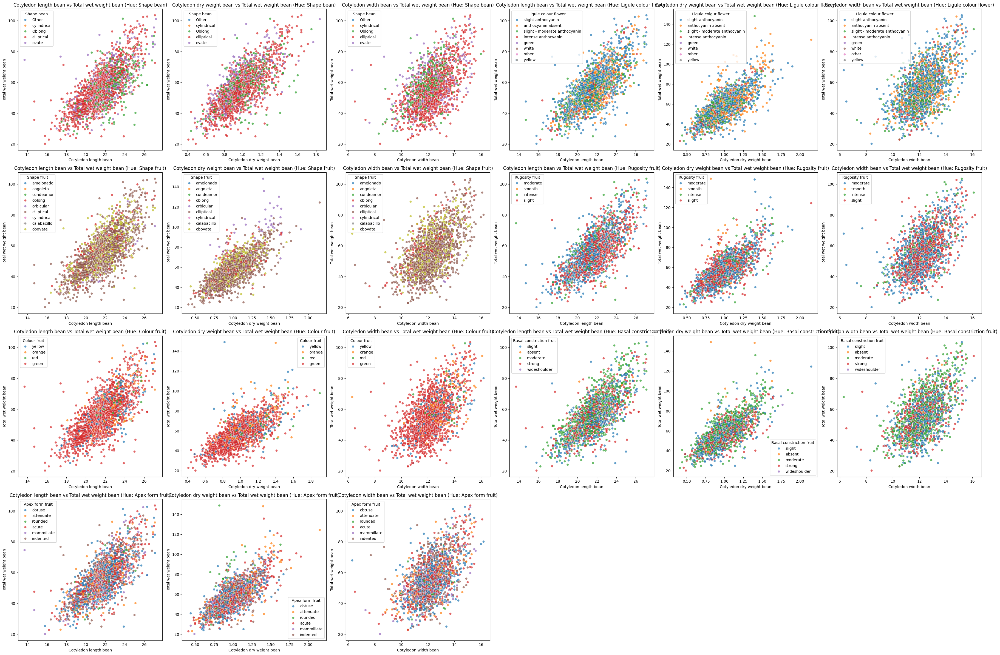

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#plt.figure(figsize=(18, 30))

# Define pairs of x and y variables
pairs = [
    ('Cotyledon length bean', 'Total wet weight bean'),
    ('Cotyledon dry weight bean', 'Total wet weight bean'),
    ('Cotyledon width bean', 'Total wet weight bean')
]

# Define hue options
categorical_columns = ['Shape bean', 'Ligule colour flower', 'Shape fruit', 'Rugosity fruit', 'Colour fruit', 'Basal constriction fruit', 'Apex form fruit']

total_subplots = len(pairs) * len(categorical_columns)

# Calculate the number of rows and columns for the subplot grid
num_rows = int(total_subplots ** 0.5)
num_cols = total_subplots // num_rows + (1 if total_subplots % num_rows else 0)

plt.figure(figsize=(num_cols * 6, num_rows * 6))

for i, (x, y) in enumerate(pairs, start=1):
    for j, hue in enumerate(categorical_columns, start=1):
        plt.subplot(num_rows, num_cols, (j - 1) * len(pairs) + i)
        sns.scatterplot(data=df_Analyze, x=x, y=y, hue=hue, alpha=0.7)
        plt.title(f'{x} vs {y} (Hue: {hue})')
        plt.xlabel(x)
        plt.ylabel(y)
        plt.tight_layout()  # Ensures proper spacing between subplots

plt.show()

Let's use Orthogonal contrasts. Therefore, we'll create new column and split the column "Cotyledon width bean" to bins.

In [ ]:
# Define the number of bins and their labels
num_bins = 3
bin_labels = ['Small', 'Medium', 'Large']

# Create categorical bins for 'Cotyledon width bean' column
df_Analyze['Cotyledon width bean bins'] = pd.cut(df_Analyze['Cotyledon width bean'], bins=num_bins, labels=bin_labels)

# Create categorical bins for 'Cotyledon dry weight bean' column
df_Analyze['Cotyledon dry weight bean'] = pd.cut(df_Analyze['Cotyledon dry weight bean'], bins=num_bins, labels=bin_labels)

df_Analyze.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3861 entries, 0 to 3860
Data columns (total 27 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   Clone name + Refcode        3861 non-null   object  
 1   Number bean                 3420 non-null   float64 
 2   Total wet weight bean       2000 non-null   float64 
 3   Cotyledon dry weight bean   2606 non-null   category
 4   Cotyledon length bean       2473 non-null   float64 
 5   Cotyledon width bean        2473 non-null   float64 
 6   Shape bean                  2135 non-null   object  
 7   Colour bean                 2012 non-null   object  
 8   Self compatibility flower   1445 non-null   object  
 9   Ovule number flower         2147 non-null   float64 
 10  Ligule colour flower        2667 non-null   object  
 11  Stamen colour flower        2547 non-null   object  
 12  Sepal length flower         2615 non-null   float64 
 13  Ligule width flowe

In [ ]:
# Create categorical bins for 'Cotyledon width bean' column
df_Analyze['Cotyledon width bean bins'], bin_edges = pd.cut(df_Analyze['Cotyledon width bean'], bins=num_bins, labels=bin_labels, retbins=True)

# Print out the bin edges
print("Bin Edges:")
print(bin_edges)

Bin Edges:
[ 6.289       9.96666667 13.63333333 17.3       ]


In [ ]:
# Filter DataFrame for each size of 'Cotyledon width bean bins' (1)
small_df_1 = df_Analyze[df_Analyze['Cotyledon width bean bins'] == 'Small']
medium_df_1 = df_Analyze[df_Analyze['Cotyledon width bean bins'] == 'Medium']
large_df_1 = df_Analyze[df_Analyze['Cotyledon width bean bins'] == 'Large']

In [ ]:
small_df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68 entries, 364 to 3479
Data columns (total 27 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   Clone name + Refcode        68 non-null     object  
 1   Number bean                 68 non-null     float64 
 2   Total wet weight bean       54 non-null     float64 
 3   Cotyledon dry weight bean   68 non-null     category
 4   Cotyledon length bean       68 non-null     float64 
 5   Cotyledon width bean        68 non-null     float64 
 6   Shape bean                  54 non-null     object  
 7   Colour bean                 54 non-null     object  
 8   Self compatibility flower   3 non-null      object  
 9   Ovule number flower         54 non-null     float64 
 10  Ligule colour flower        68 non-null     object  
 11  Stamen colour flower        68 non-null     object  
 12  Sepal length flower         68 non-null     float64 
 13  Ligule width flowe

In [ ]:
small_df_1['Shape bean'].value_counts()

elliptical    27
ovate         15
Oblong        12
Name: Shape bean, dtype: int64

In [ ]:
medium_df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2005 entries, 0 to 3587
Data columns (total 27 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   Clone name + Refcode        2005 non-null   object  
 1   Number bean                 1967 non-null   float64 
 2   Total wet weight bean       1627 non-null   float64 
 3   Cotyledon dry weight bean   2005 non-null   category
 4   Cotyledon length bean       2005 non-null   float64 
 5   Cotyledon width bean        2005 non-null   float64 
 6   Shape bean                  1609 non-null   object  
 7   Colour bean                 1601 non-null   object  
 8   Self compatibility flower   95 non-null     object  
 9   Ovule number flower         1665 non-null   float64 
 10  Ligule colour flower        1988 non-null   object  
 11  Stamen colour flower        1987 non-null   object  
 12  Sepal length flower         2005 non-null   float64 
 13  Ligule width flowe

In [ ]:
medium_df_1['Shape bean'].value_counts()

elliptical    957
ovate         330
Oblong        322
Name: Shape bean, dtype: int64

In [ ]:
large_df_1.info()

In [ ]:
large_df_1['Shape bean'].value_counts()

elliptical    175
ovate          47
Oblong         17
Name: Shape bean, dtype: int64

In [ ]:
# Let's define the function

def Anova_test(df,category,target):
  # Group numerical data by categories in 'Colour' column
  df_copy=df.copy()
  df_filtered = df_copy.dropna(subset=[target])
  df_filtered=df_filtered.dropna(subset=[category])
  groups = {}
  for sub_category, data in df_filtered.groupby(category)[target]:
    groups[sub_category] = data.values
  # Extract numerical data arrays from the dictionary
  data_arrays = list(groups.values())
  # Perform ANOVA test
  f_statistic, p_value = f_oneway(*data_arrays)
  # Print the results
  print("ANOVA Test Results:")
  print("F-statistic:", f_statistic)
  print("p-value:", p_value)
  # Interpret the results
  if p_value < 0.05:
    print(f"Reject the null hypothesis. There is significant evidence to suggest that there are differences in the means of 'Total wet weight' based on {category}")
    print()
    print()
    # Perform Tukey HSD test
    tukey_results = pairwise_tukeyhsd(df_filtered[target], df_filtered[category],alpha=0.05)
    # Print the Tukey HSD test results
    print("\nTukey HSD Test Results:")
    print(tukey_results)

  else:
    print(f"Fail to reject the null hypothesis. There is not enough evidence to suggest that there are differences in the means of 'Total wet weight' based on {category}.")

Now, we'll perform an one way anova test for each sub dataframe

In [ ]:
Anova_test(small_df_1,'Shape bean','Total wet weight bean')

ANOVA Test Results:
F-statistic: 2.2582885194260567
p-value: 0.11488441594512523
Fail to reject the null hypothesis. There is not enough evidence to suggest that there are differences in the means of 'Total wet weight' based on Shape bean.


In [ ]:
Anova_test(medium_df_1,'Shape bean','Total wet weight bean')

ANOVA Test Results:
F-statistic: 24.4138631562069
p-value: 3.5907069991254746e-11
Reject the null hypothesis. There is significant evidence to suggest that there are differences in the means of 'Total wet weight' based on Shape bean



Tukey HSD Test Results:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
  group1     group2   meandiff p-adj   lower   upper  reject
------------------------------------------------------------
    Oblong elliptical  -4.5841    0.0 -6.3261 -2.8421   True
    Oblong      ovate  -1.1001 0.4424 -3.2181   1.018  False
elliptical      ovate    3.484    0.0  1.7579  5.2102   True
------------------------------------------------------------


In [ ]:
Anova_test(large_df_1,'Shape bean','Total wet weight bean')

ANOVA Test Results:
F-statistic: 0.12296211292690762
p-value: 0.884353781619536
Fail to reject the null hypothesis. There is not enough evidence to suggest that there are differences in the means of 'Total wet weight' based on Shape bean.


Displaying boxplot for the medium dataframe

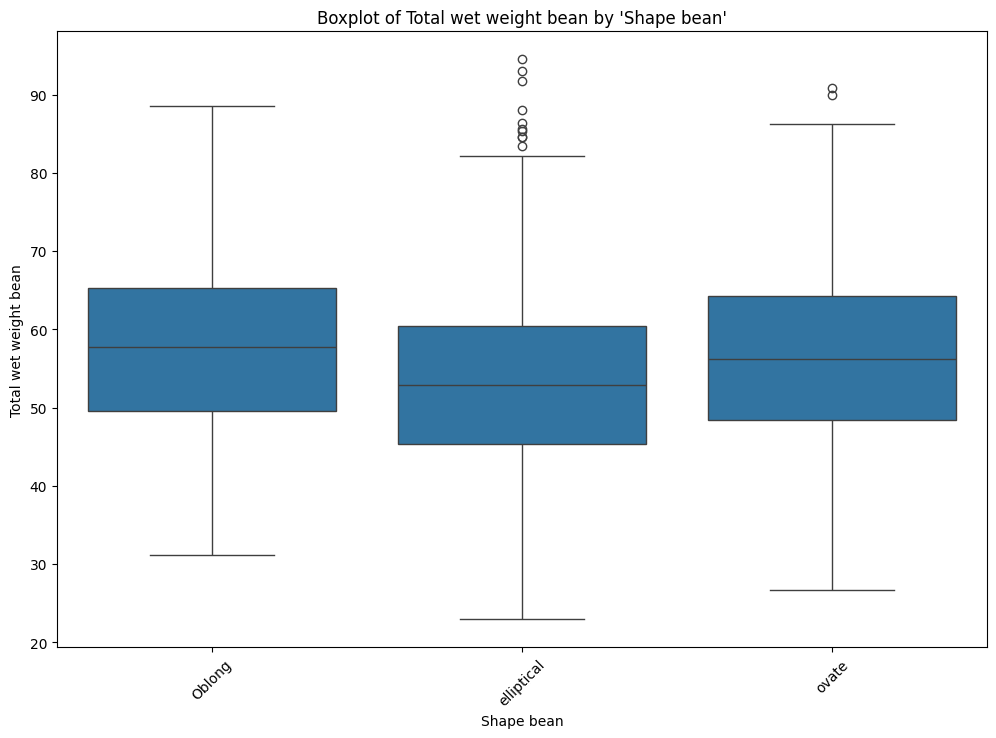

In [ ]:
    plt.figure(figsize=(12, 8))
    plt.xticks(rotation=45)

    # Filter the DataFrame to include only rows with non-null "Total wet weight bean"
    df_filtered = medium_df_1.dropna(subset=['Total wet weight bean'])

    # Filter out categorical values that do not have any "Total wet weight bean"
    values_with_data = df_filtered['Shape bean'].unique()

    # Plot the boxplot for filtered data
    sns.boxplot(data=df_filtered[df_filtered['Shape bean'].isin(values_with_data)], x='Shape bean', y="Total wet weight bean")

    plt.title(f"Boxplot of Total wet weight bean by 'Shape bean'")
    plt.show()

## **Statistical Tests**

### Do some categories have a statistically significant effect on the total wet weight of beans?

Let's conduct a One-Way ANOVA Test

In [ ]:
# Making adjustments

# Remove rows with value "Other" from the "Shape bean" column
df_Analyze = df_Analyze[df_Analyze['Shape bean'] != 'Other']

# Remove rows with values "amelonado", "angoleta", "cundeamor" from the "Shape fruit" column
df_Analyze = df_Analyze[~df_Analyze['Shape fruit'].isin(['amelonado', 'angoleta', 'cundeamor'])]


In [ ]:
# Let's define the function

def Anova_test(df,category,target):
  # Group numerical data by categories in 'Colour' column
  df_copy=df.copy()
  df_filtered = df_copy.dropna(subset=[target])
  df_filtered=df_filtered.dropna(subset=[category])
  groups = {}
  for sub_category, data in df_filtered.groupby(category)[target]:
    groups[sub_category] = data.values
  # Extract numerical data arrays from the dictionary
  data_arrays = list(groups.values())
  # Perform ANOVA test
  f_statistic, p_value = f_oneway(*data_arrays)
  # Print the results
  print("ANOVA Test Results:")
  print("F-statistic:", f_statistic)
  print("p-value:", p_value)
  # Interpret the results
  if p_value < 0.05:
    print(f"Reject the null hypothesis. There is significant evidence to suggest that there are differences in the means of 'Total wet weight' based on {category}")
    print()
    print()
    # Perform Tukey HSD test
    tukey_results = pairwise_tukeyhsd(df_filtered[target], df_filtered[category],alpha=0.05)
    # Print the Tukey HSD test results
    print("\nTukey HSD Test Results:")
    print(tukey_results)

  else:
    print(f"Fail to reject the null hypothesis. There is not enough evidence to suggest that there are differences in the means of 'Total wet weight' based on {category}.")

In [ ]:
# Let's define the categories we want

categories_for_annova=['Shape bean','Colour bean','Ligule colour flower','Stamen colour flower','Shape fruit','Rugosity fruit','Colour fruit','Basal constriction fruit','Apex form fruit','Hardness fruit','Furrow desc fruit','Self compatibility flower']

In [ ]:
# Let's call the function

for category in categories_for_annova:
  Anova_test(df_Analyze,category,'Total wet weight bean')

ANOVA Test Results:
F-statistic: 6.993478770378132
p-value: 0.0009416631256163647
Reject the null hypothesis. There is significant evidence to suggest that there are differences in the means of 'Total wet weight' based on Shape bean



Tukey HSD Test Results:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
  group1     group2   meandiff p-adj   lower   upper  reject
------------------------------------------------------------
    Oblong elliptical  -2.2522 0.0173 -4.1837 -0.3207   True
    Oblong      ovate   0.2289 0.9712 -2.1016  2.5594  False
elliptical      ovate   2.4811 0.0049  0.6267  4.3355   True
------------------------------------------------------------
ANOVA Test Results:
F-statistic: 0.9933844346580106
p-value: 0.3705145079752117
Fail to reject the null hypothesis. There is not enough evidence to suggest that there are differences in the means of 'Total wet weight' based on Colour bean.
ANOVA Test Results:
F-statistic: 12.969191473699318
p-value: 2.1749979824

In [ ]:
df_Analyze['Shape bean'].value_counts()

elliptical     1159
ovate           392
Oblong          352
cylindrical       5
Name: Shape bean, dtype: int64

In [ ]:
df_Analyze['Apex form fruit'].value_counts()

obtuse        827
acute         714
indented      486
attenuate     186
mammillate    175
rounded        74
Name: Apex form fruit, dtype: int64

In [ ]:
df_Analyze['Shape fruit'].value_counts()

elliptical     1283
obovate         424
oblong          179
orbicular        84
calabacillo      11
cylindrical       5
Name: Shape fruit, dtype: int64

Let's display boxplots for the the pairs that in the One-Way Anova test there was evidence to suggest that there are differences in the means

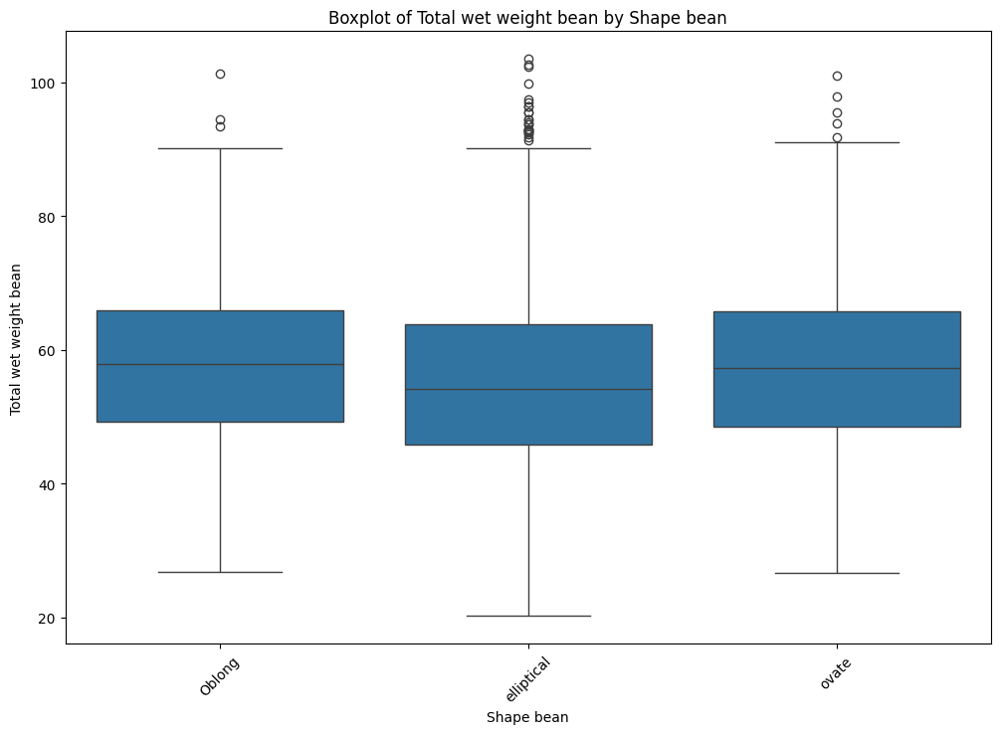

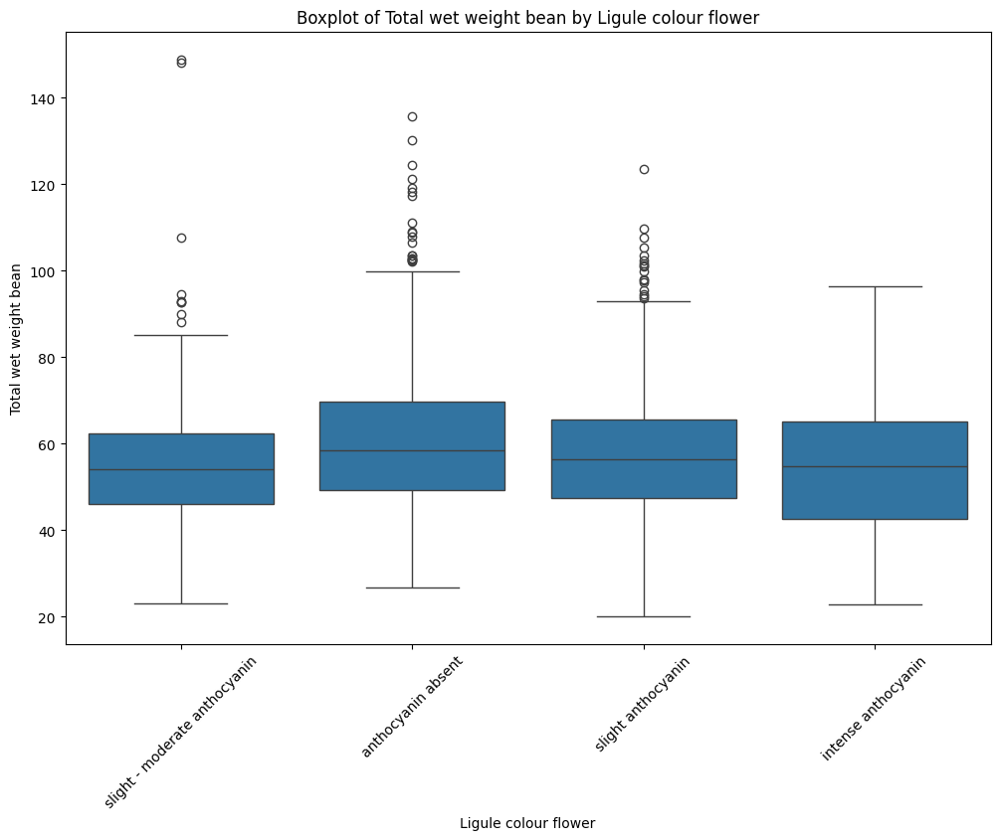

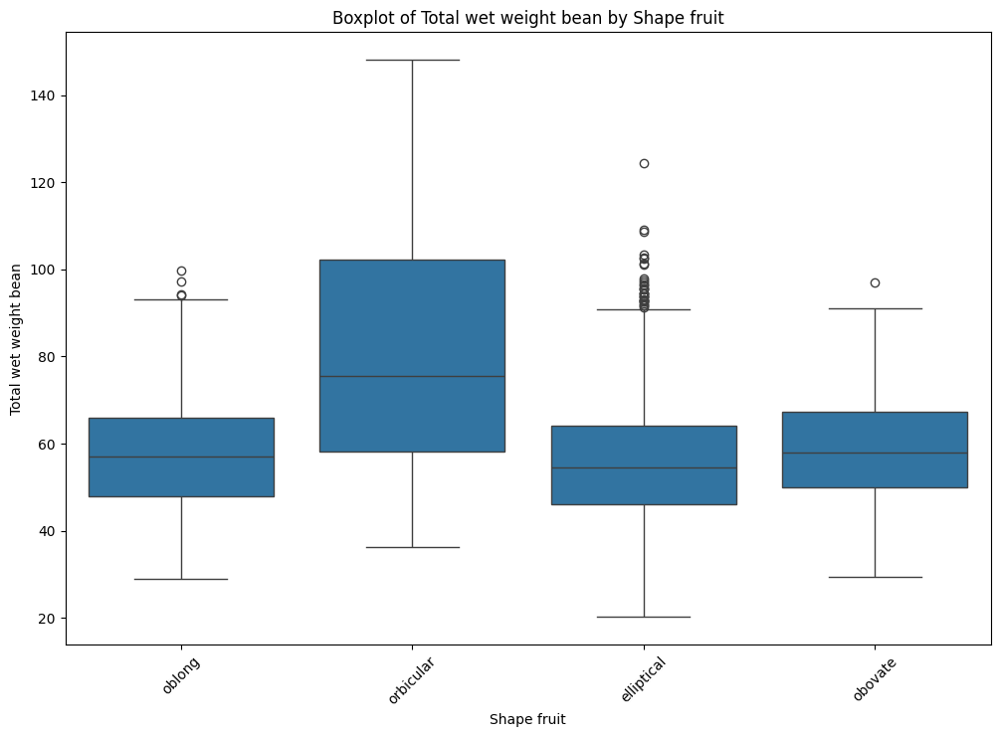

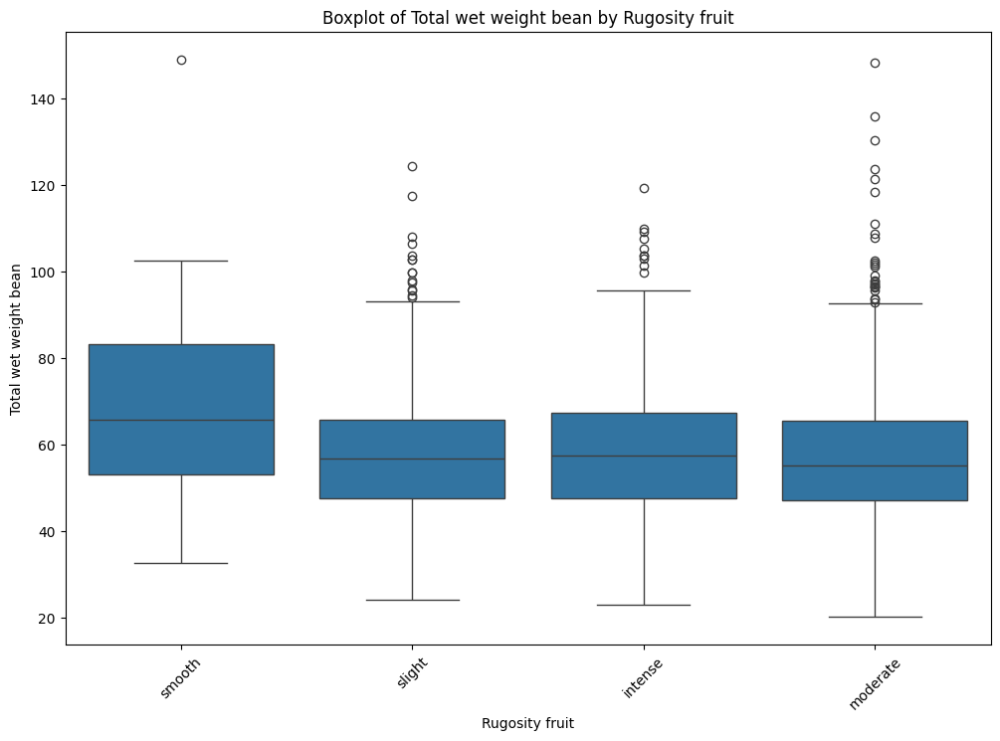

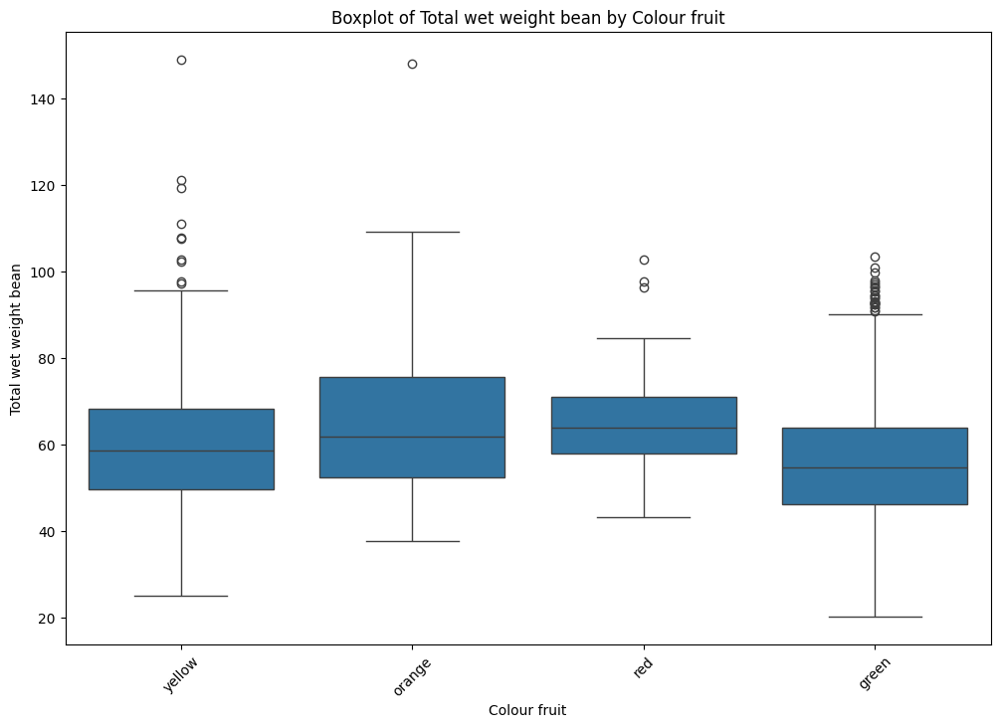

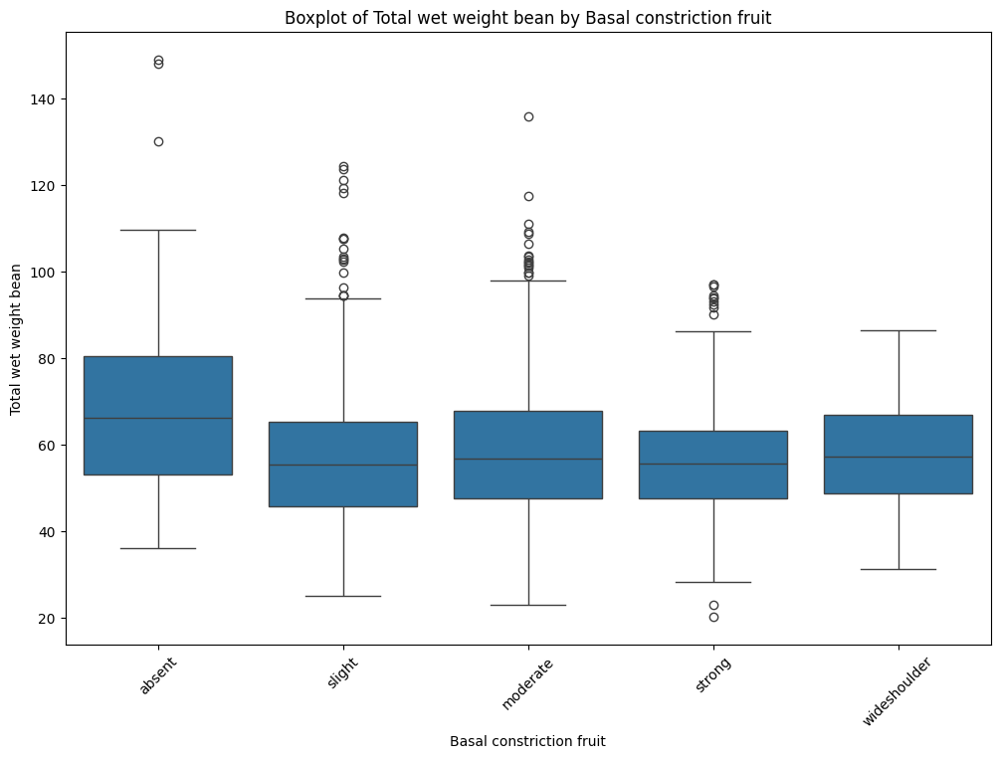

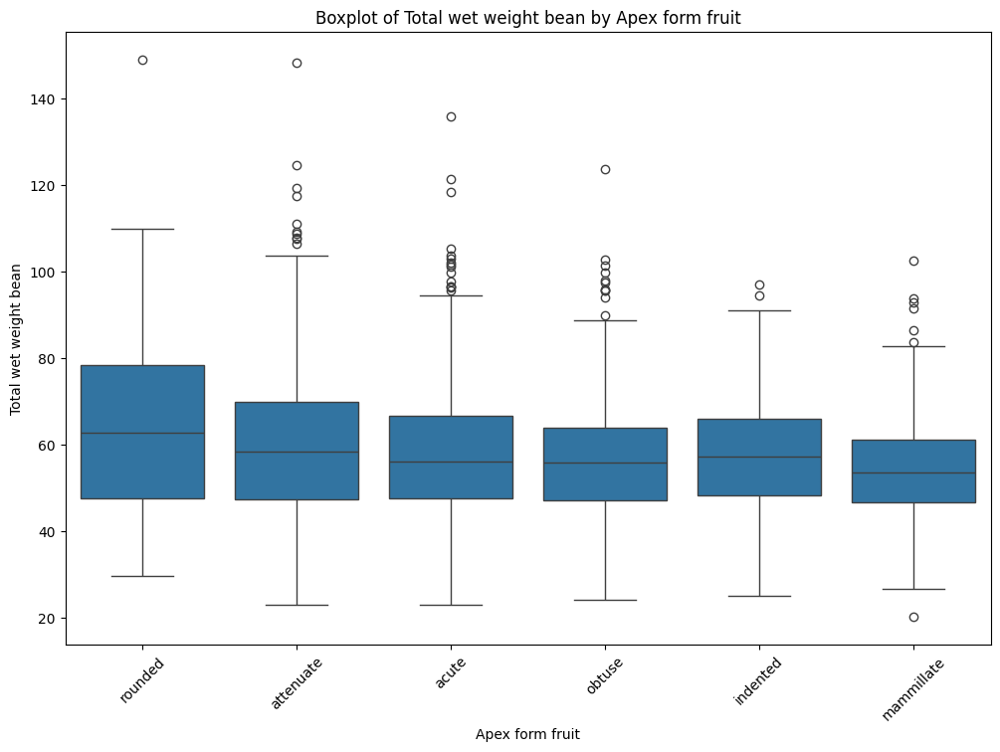

In [ ]:
# Let's define the relevant categorical columns
categorical_columns = ['Shape bean', 'Ligule colour flower' ,'Shape fruit', 'Rugosity fruit', 'Colour fruit' ,'Basal constriction fruit' ,'Apex form fruit']

# We'll display a boxplot for each relevant columns
for column in categorical_columns:
    plt.figure(figsize=(12, 8))
    plt.xticks(rotation=45)

    # Filter the DataFrame to include only rows with non-null "Total wet weight bean"
    df_filtered = df_Analyze.dropna(subset=['Total wet weight bean'])

    # Filter out categorical values that do not have any "Total wet weight bean"
    values_with_data = df_filtered[column].unique()

    # Plot the boxplot for filtered data
    sns.boxplot(data=df_filtered[df_filtered[column].isin(values_with_data)], x=column, y="Total wet weight bean")
    plt.title(f"Boxplot of Total wet weight bean by {column}")
    plt.show()

Now, let's perform a Chi-Square Test:

In [ ]:
# Let's define the function

def chi_square_test(categorical_column1, categorical_column2, dataframe):
    """
    Performs Chi-Square test on two categorical columns in a dataframe.

    Parameters:
    categorical_column1 (str): Name of the first categorical column.
    categorical_column2 (str): Name of the second categorical column.
    dataframe (DataFrame): Pandas DataFrame containing the data.

    Returns:
    chi2_stat (float): Chi-Square statistic.
    p_val (float): p-value.
    dof (int): Degrees of freedom.
    expected (ndarray): Expected frequencies.
    """
    # Contingency table
    observed = pd.crosstab(dataframe[categorical_column1], dataframe[categorical_column2])

    # Perform Chi-Square test
    chi2_stat, p_val, dof, expected = chi2_contingency(observed)

    return chi2_stat, p_val, dof, expected

In [ ]:
# Let's define the categorical columns

categorical_columns = list(df_Analyze.select_dtypes(include='object').columns)

# Exclude specific column
exclude_columns = ["Clone name + Refcode"]
categorical_columns = [col for col in categorical_columns if col not in exclude_columns]

print(categorical_columns)

['Shape bean', 'Colour bean', 'Self compatibility flower', 'Ligule colour flower', 'Stamen colour flower', 'Shape fruit', 'Rugosity fruit', 'Colour fruit', 'Basal constriction fruit', 'Apex form fruit', 'Hardness fruit', 'Furrow desc fruit']


In [ ]:
# Create an empty DataFrame to store the results
results_table = pd.DataFrame(columns=['Column 1', 'Column 2', 'Chi-Square Statistic', 'P-value', 'Degrees of Freedom', 'Expected Frequencies', 'Result'])

In [ ]:
# Iterate through all possible combinations of categorical columns
for i in range(len(categorical_columns)):
    for j in range(i+1, len(categorical_columns)):
        column1 = categorical_columns[i]
        column2 = categorical_columns[j]

        # Check if both columns have more than one unique value
        if len(df_Analyze[column1].unique()) > 1 and len(df_Analyze[column2].unique()) > 1:
            # Create the contingency table
            observed = pd.crosstab(df_Analyze[column1], df_Analyze[column2])

            # Check if the contingency table has non-zero size
            if observed.size > 0:
                # Call chi_square_test function for each combination
                chi2_stat, p_val, dof, expected = chi_square_test(column1, column2, df_Analyze)

                # Check significance level (commonly set at 5%)
                alpha = 0.05
                if p_val < alpha:
                    result = "Significant association"
                else:
                    result = "No significant association"

                # Append the results to the table
                results_table = results_table.append({'Column 1': column1,
                                                      'Column 2': column2,
                                                      'Chi-Square Statistic': chi2_stat,
                                                      'P-value': p_val,
                                                      'Degrees of Freedom': dof,
                                                      'Expected Frequencies': expected,
                                                      'Result': result}, ignore_index=True)
            else:
                results_table = results_table.append({'Column 1': column1,
                                                      'Column 2': column2,
                                                      'Result': "No Chi-Square test performed: Contingency table has size 0."}, ignore_index=True)
        else:
            results_table = results_table.append({'Column 1': column1,
                                                  'Column 2': column2,
                                                  'Result': "No Chi-Square test performed: One of the columns has only one unique value."}, ignore_index=True)

# Display the results table
print(results_table)

<ipython-input-28-0bcebc54282b>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_table = results_table.append({'Column 1': column1,
<ipython-input-28-0bcebc54282b>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_table = results_table.append({'Column 1': column1,
<ipython-input-28-0bcebc54282b>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_table = results_table.append({'Column 1': column1,
<ipython-input-28-0bcebc54282b>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_table = results_table.append({'Column 1': column1,
<ipython-input-28-0bcebc54282b>:25: FutureWarning: The frame.append method is de

                    Column 1                   Column 2  Chi-Square Statistic  \
0                 Shape bean                Colour bean             25.311762   
1                 Shape bean  Self compatibility flower              0.000000   
2                 Shape bean       Ligule colour flower             10.064672   
3                 Shape bean       Stamen colour flower           1456.738377   
4                 Shape bean                Shape fruit           1561.549412   
..                       ...                        ...                   ...   
61  Basal constriction fruit             Hardness fruit             16.779523   
62  Basal constriction fruit          Furrow desc fruit             95.627874   
63           Apex form fruit             Hardness fruit             94.288034   
64           Apex form fruit          Furrow desc fruit             64.233069   
65            Hardness fruit          Furrow desc fruit             28.149184   

          P-value Degrees o

<ipython-input-28-0bcebc54282b>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_table = results_table.append({'Column 1': column1,


In [ ]:
from tabulate import tabulate

# Convert DataFrame to a list of lists for tabulate, excluding the 'Expected Frequencies' column
results_list = results_table[['Column 1', 'Column 2', 'Chi-Square Statistic', 'P-value', 'Degrees of Freedom', 'Result']].values.tolist()

# Print the table using tabulate
print(tabulate(results_list, headers=['Column 1', 'Column 2', 'Chi-Square Statistic', 'P-value', 'Degrees of Freedom', 'Result'], tablefmt='pretty'))

+---------------------------+---------------------------+----------------------+-------------------------+--------------------+-------------------------------------------------------------+
|         Column 1          |         Column 2          | Chi-Square Statistic |         P-value         | Degrees of Freedom |                           Result                            |
+---------------------------+---------------------------+----------------------+-------------------------+--------------------+-------------------------------------------------------------+
|        Shape bean         |        Colour bean        |  25.311761631367542  |  0.0002989185617625315  |         6          |                   Significant association                   |
|        Shape bean         | Self compatibility flower |         0.0          |           1.0           |         0          |                 No significant association                  |
|        Shape bean         |   Ligule colour flow

Let's conduct a Two-Way Anova test:

In [ ]:
# Let's define the funciton

from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

def TwoWay_Anova_test(df, category1, category2, target):
    # Filter out rows with missing values in target and both categories
    df_filtered = df.dropna(subset=[target, category1, category2])

    # Perform Two-Way ANOVA
    formula = f"{target} ~ C({category1}) + C({category2}) + C({category1}):C({category2})"
    model = ols(formula, data=df_filtered).fit()
    anova_table = anova_lm(model, typ=2)

    # Print ANOVA table
    print("Two-Way ANOVA Test Results:")
    print(anova_table)

In [ ]:
# Create a copy of the DataFrame
df_Analyze_copy = df_Analyze.copy()

# Replace spaces with underscores in column names
df_Analyze_copy.columns = df_Analyze_copy.columns.str.replace(' ', '_')

# Display the modified DataFrame
df_Analyze_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2805 entries, 0 to 3778
Data columns (total 27 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   Clone_name_+_Refcode        2805 non-null   object  
 1   Number_bean                 2605 non-null   float64 
 2   Total_wet_weight_bean       1993 non-null   float64 
 3   Cotyledon_dry_weight_bean   2470 non-null   category
 4   Cotyledon_length_bean       2404 non-null   float64 
 5   Cotyledon_width_bean        2404 non-null   float64 
 6   Shape_bean                  1908 non-null   object  
 7   Colour_bean                 1901 non-null   object  
 8   Self_compatibility_flower   523 non-null    object  
 9   Ovule_number_flower         2005 non-null   float64 
 10  Ligule_colour_flower        2450 non-null   object  
 11  Stamen_colour_flower        2386 non-null   object  
 12  Sepal_length_flower         2473 non-null   float64 
 13  Ligule_width_flowe

In [ ]:
# Calling the function qnd applying on it relevant columns

import itertools

# Define the categorical columns
categorical_columns = ['Shape_bean', 'Ligule_colour_flower', 'Shape_fruit',
                       'Rugosity_fruit', 'Colour_fruit', 'Basal_constriction_fruit',
                       'Apex_form_fruit']

# Define the target column
target_column = 'Total_wet_weight_bean'

# Iterate over all combinations of two categorical columns
for combo in itertools.combinations(categorical_columns, 2):
    # Call the TwoWay_Anova_test function for each combination
    print(f"ANOVA Test for combination: {combo}")
    TwoWay_Anova_test(df_Analyze_copy, combo[0], combo[1], target_column)
    print("\n" + "="*50 + "\n")  # Separate the results for readability

ANOVA Test for combination: ('Shape_bean', 'Ligule_colour_flower')
Two-Way ANOVA Test Results:
                                              sum_sq      df         F  \
C(Shape_bean)                            2561.759748     2.0  7.066064   
C(Ligule_colour_flower)                  2527.174294     3.0  4.647112   
C(Shape_bean):C(Ligule_colour_flower)    1476.449497     6.0  1.357490   
Residual                               342604.145204  1890.0       NaN   

                                         PR(>F)  
C(Shape_bean)                          0.000876  
C(Ligule_colour_flower)                0.003053  
C(Shape_bean):C(Ligule_colour_flower)  0.228306  
Residual                                    NaN  


ANOVA Test for combination: ('Shape_bean', 'Shape_fruit')
Two-Way ANOVA Test Results:
                                     sum_sq      df         F    PR(>F)
C(Shape_bean)                   1982.065869     2.0  5.470385  0.004277
C(Shape_fruit)                  2866.674602     3.0 

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 3
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 12, but rank is 11
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '
/usr/local

Two-Way ANOVA Test Results:
                                                      sum_sq      df  \
C(Rugosity_fruit)                                5070.995087     3.0   
C(Basal_constriction_fruit)                      6666.086923     4.0   
C(Rugosity_fruit):C(Basal_constriction_fruit)    8742.396784    12.0   
Residual                                       453429.095274  1952.0   

                                                      F    PR(>F)  
C(Rugosity_fruit)                              7.276832  0.000710  
C(Basal_constriction_fruit)                    7.174331  0.000086  
C(Rugosity_fruit):C(Basal_constriction_fruit)  3.136315  0.000326  
Residual                                            NaN       NaN  


ANOVA Test for combination: ('Rugosity_fruit', 'Apex_form_fruit')
Two-Way ANOVA Test Results:
                                             sum_sq      df         F  \
C(Rugosity_fruit)                       2426.756165     3.0  3.501022   
C(Apex_form_fruit)           

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 3
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 4
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 20, but rank is 18
  warnings.warn('covariance of constraints does not have full '


Let's display boxplots and violinplots for the pairs in the Two-Way Anova test that their interaction had significant effect on the target value

In [ ]:
# Making the list of pairs

combinations = [
    ['Shape bean', 'Rugosity fruit'],
    ['Shape bean', 'Colour fruit'],
    ['Shape bean', 'Basal constriction fruit'],
    ['Shape bean', 'Apex form fruit'],
    ['Ligule colour flower', 'Shape fruit'],
    ['Ligule colour flower', 'Rugosity fruit'],
    ['Ligule colour flower', 'Colour fruit'],
    ['Ligule colour flower', 'Basal constriction fruit'],
    ['Ligule colour flower', 'Apex form fruit'],
    ['Shape fruit', 'Colour fruit'],
    ['Shape fruit', 'Basal constriction fruit'],
    ['Shape fruit', 'Apex form fruit'],
    ['Rugosity fruit', 'Colour fruit'],
    ['Rugosity fruit', 'Basal constriction fruit'],
    ['Rugosity fruit', 'Apex form fruit'],
    ['Colour fruit', 'Basal constriction fruit'],
    ['Colour fruit', 'Apex form fruit'],
    ['Basal constriction fruit', 'Apex form fruit']
]

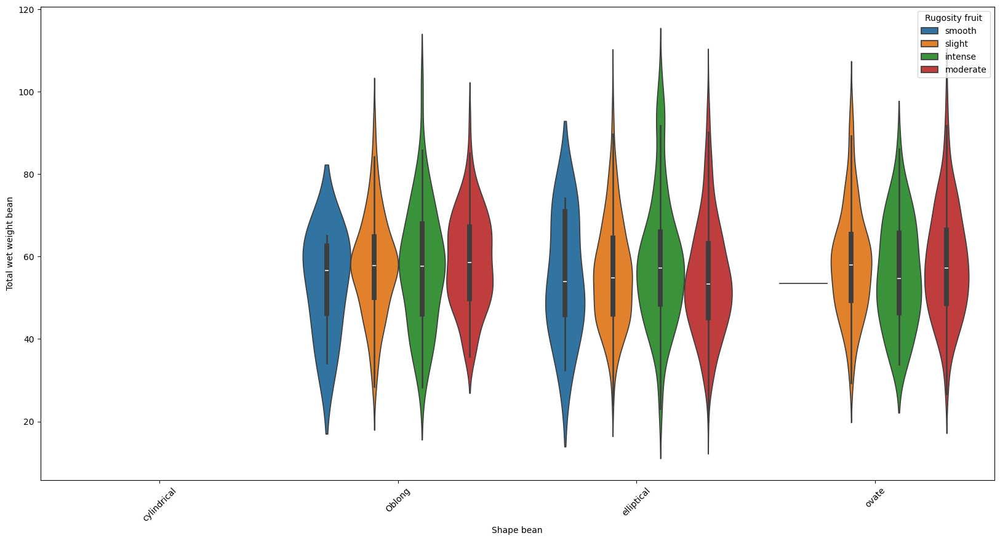

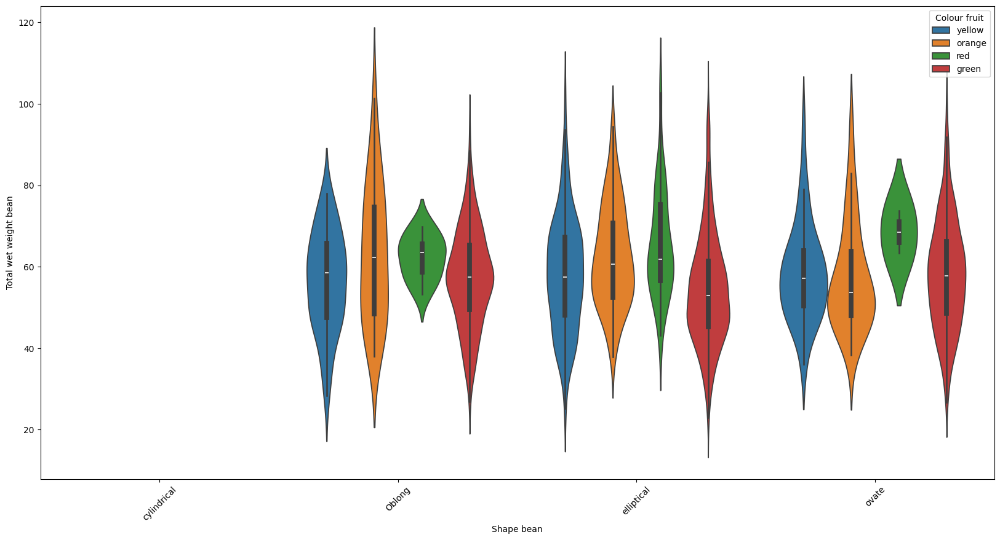

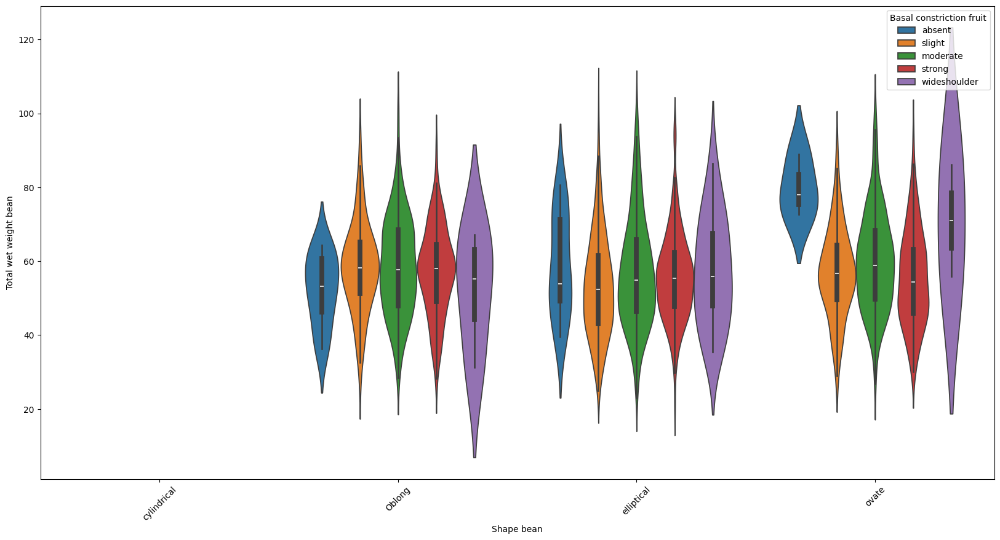

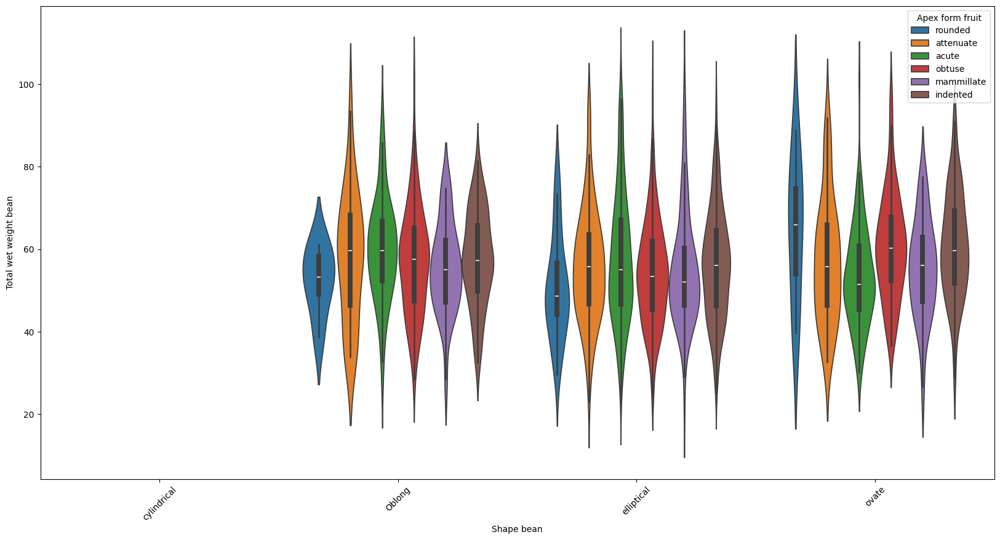

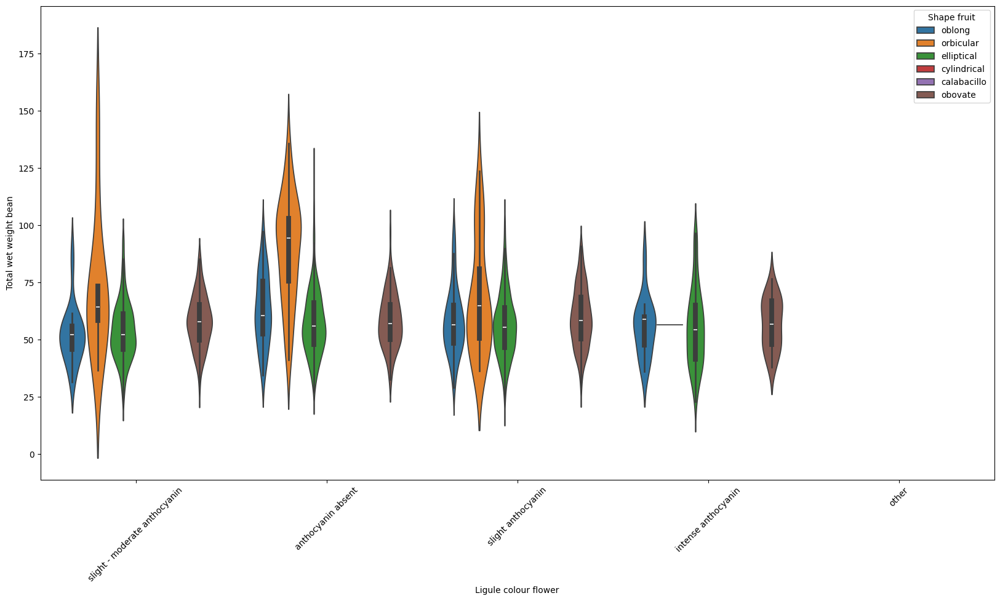

...

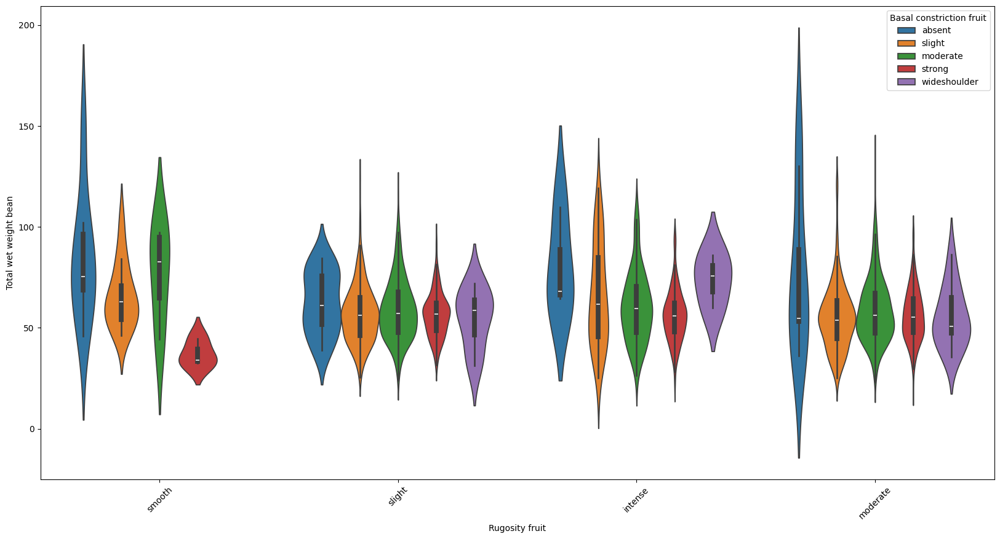

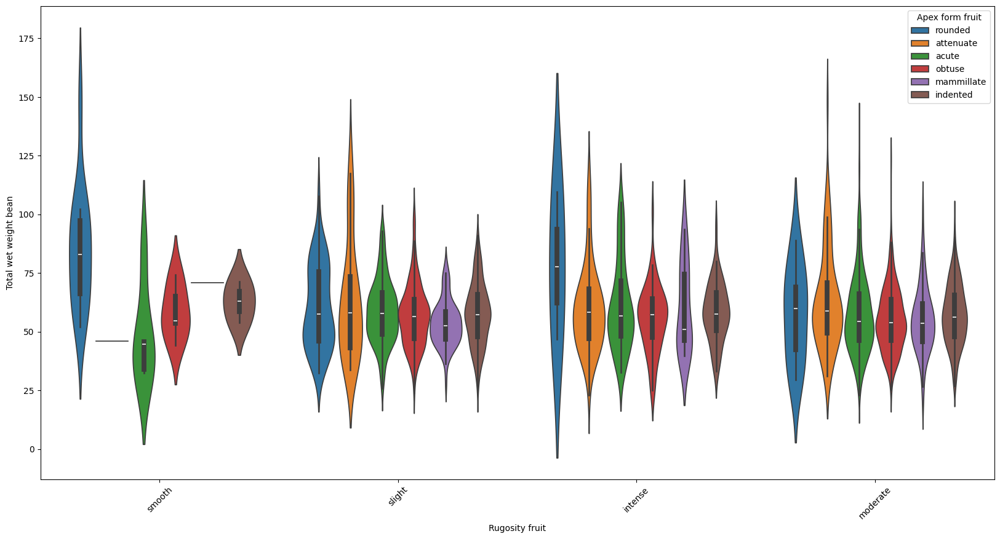

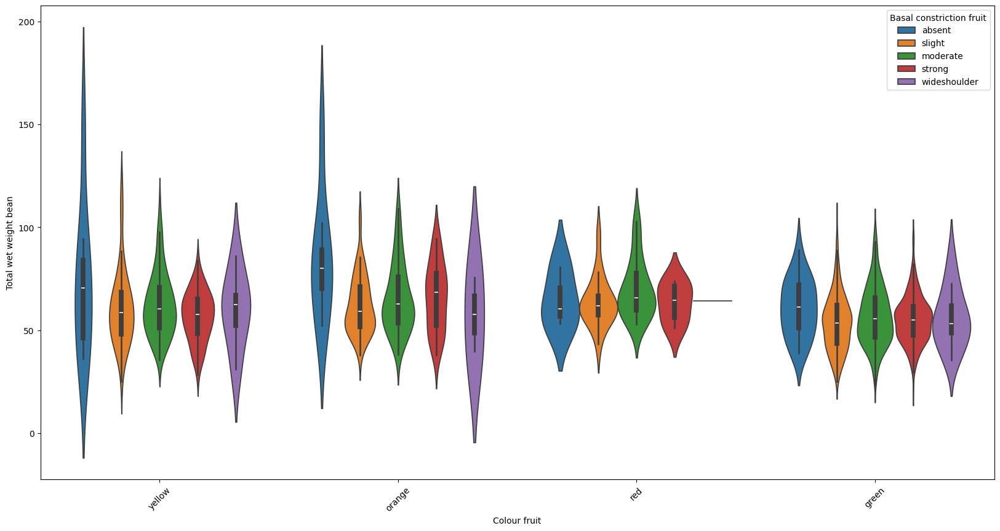

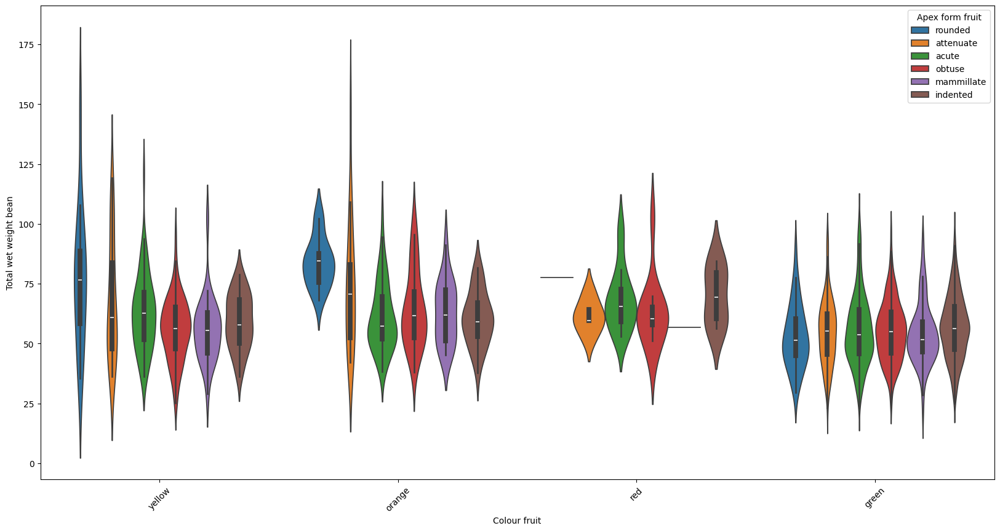

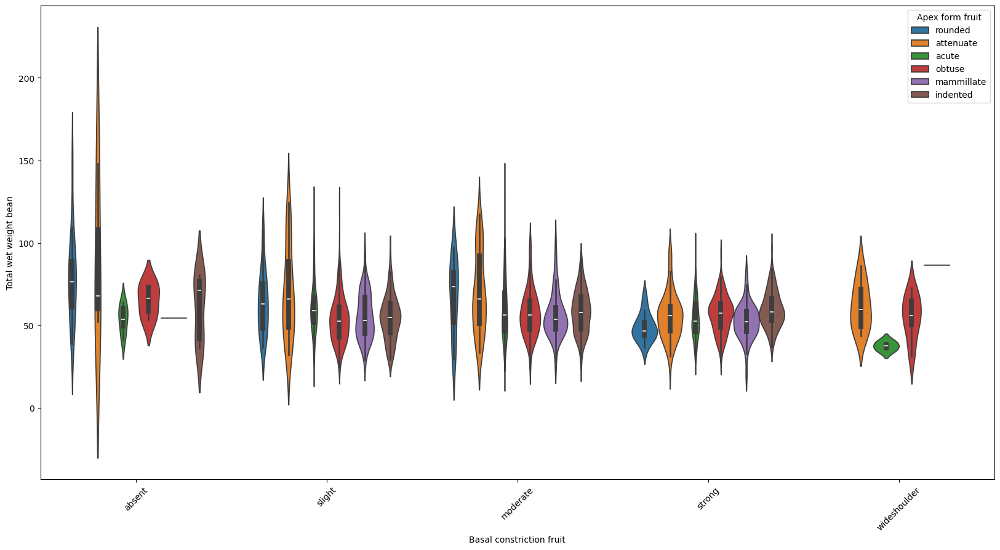

In [ ]:
# Displaying the violinplots

for pair in combinations:
  plt.figure(figsize=(20,10))
  plt.xticks(rotation=45)
  sns.violinplot(data=df_Analyze, y="Total wet weight bean", x=pair[0], hue=pair[1])

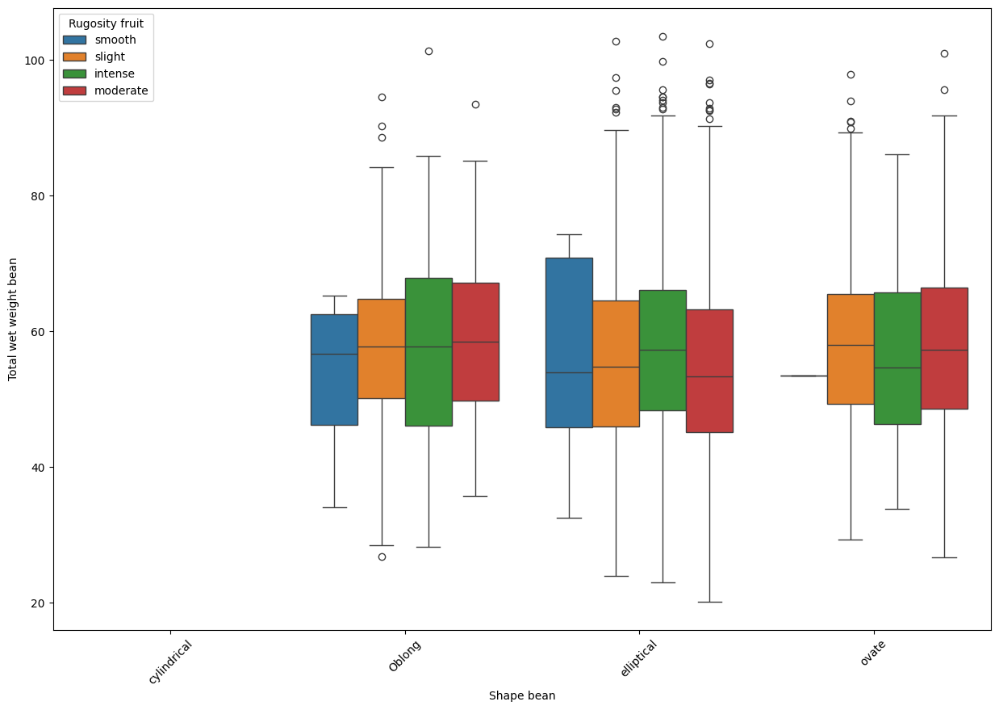

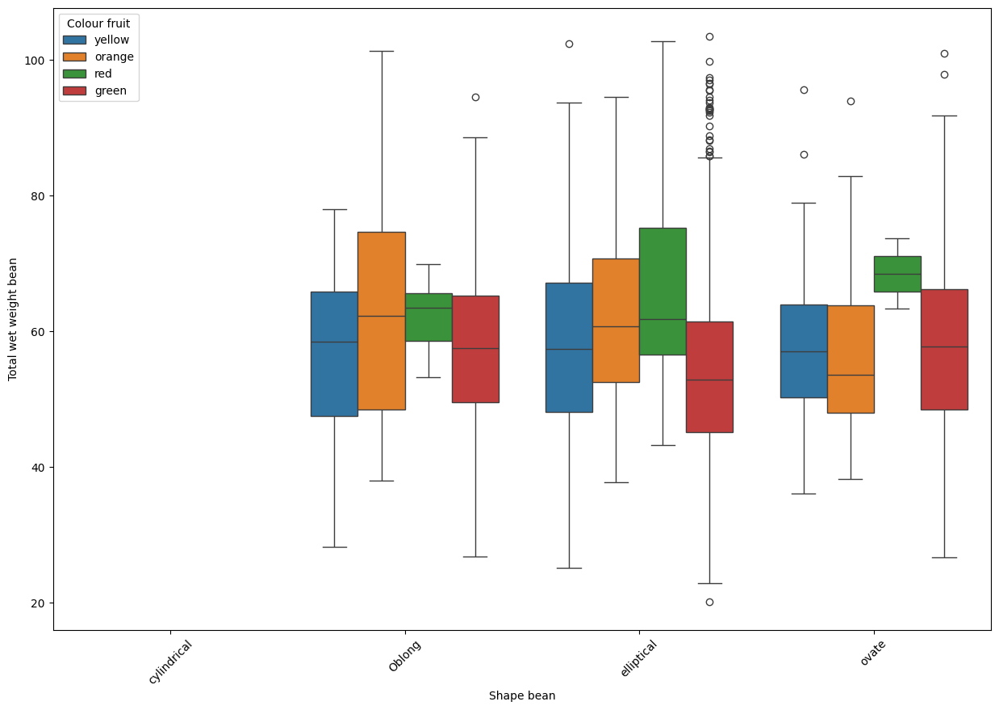

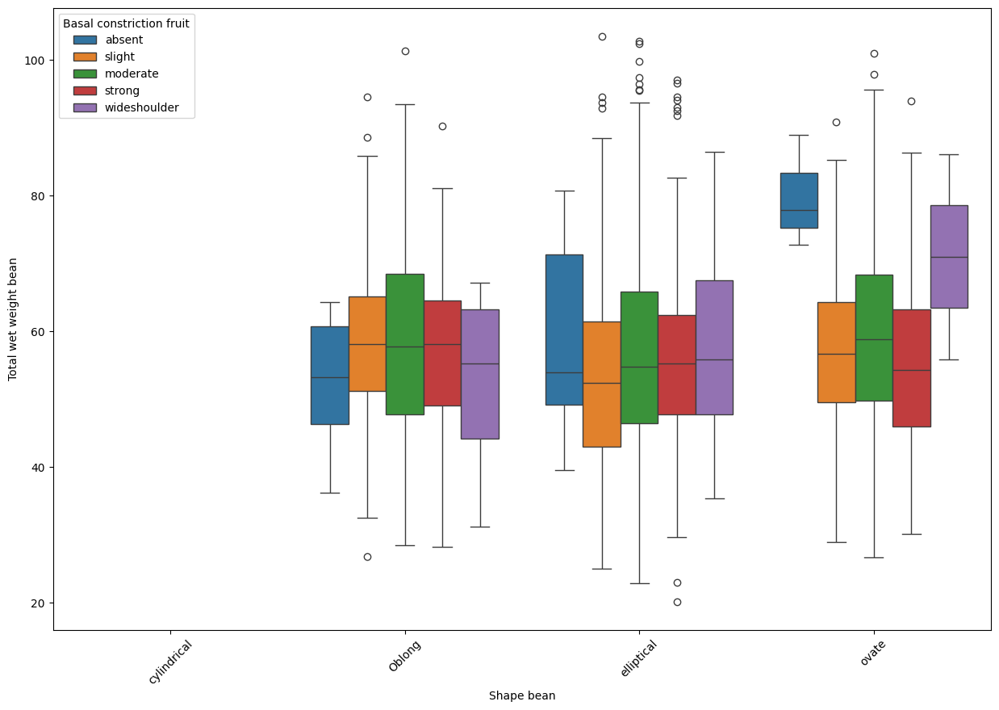

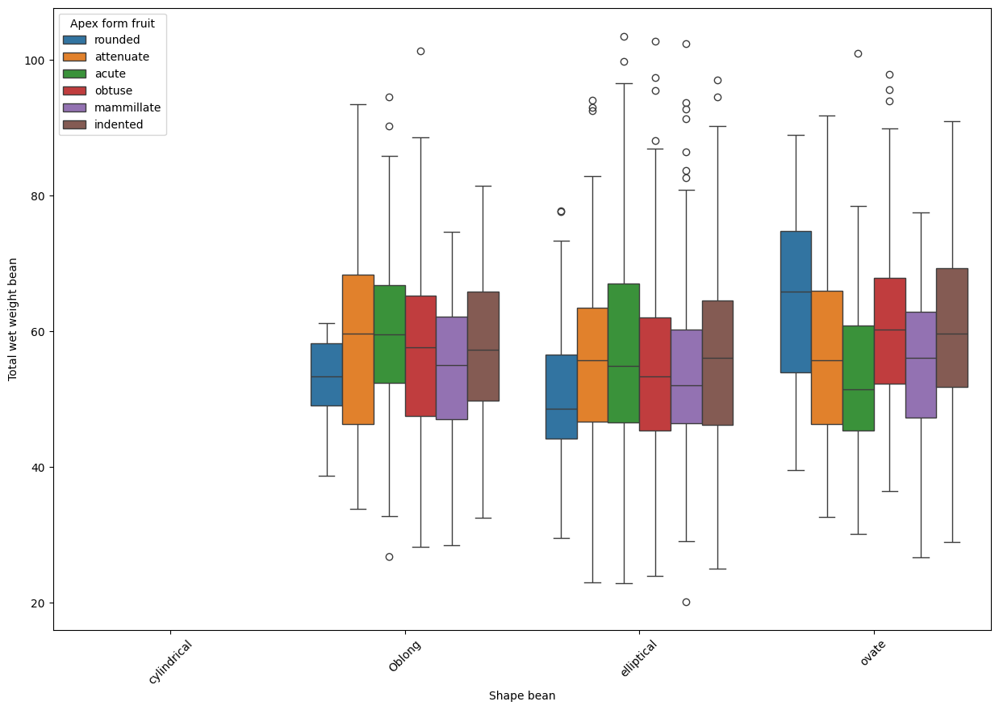

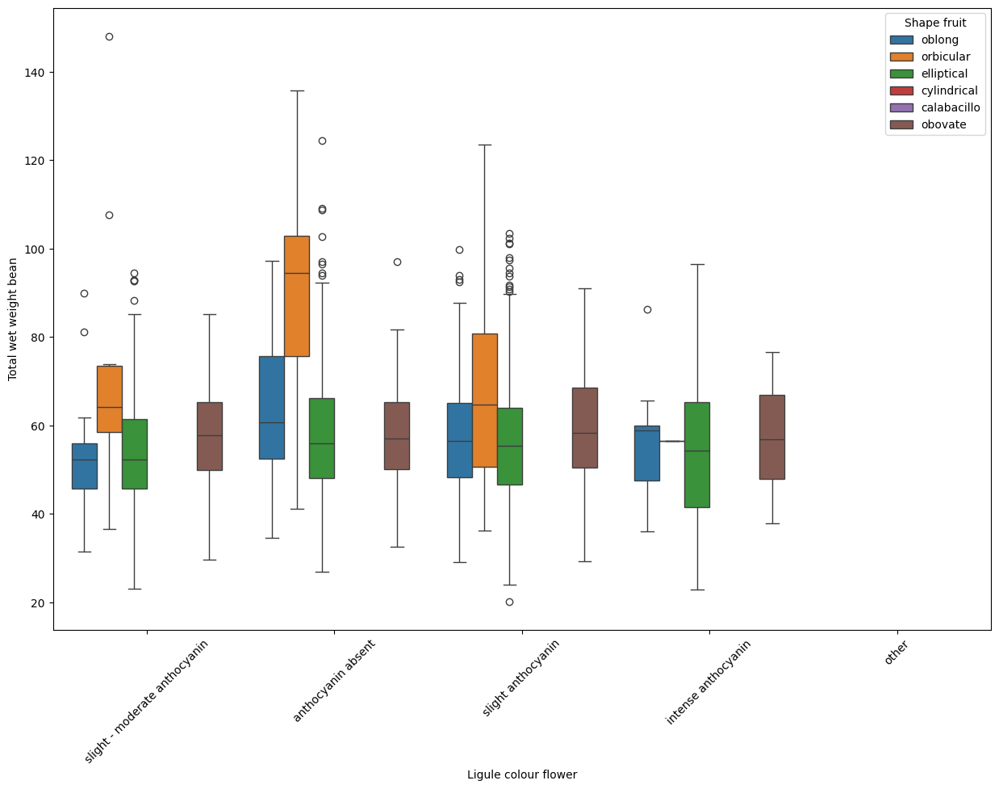

...

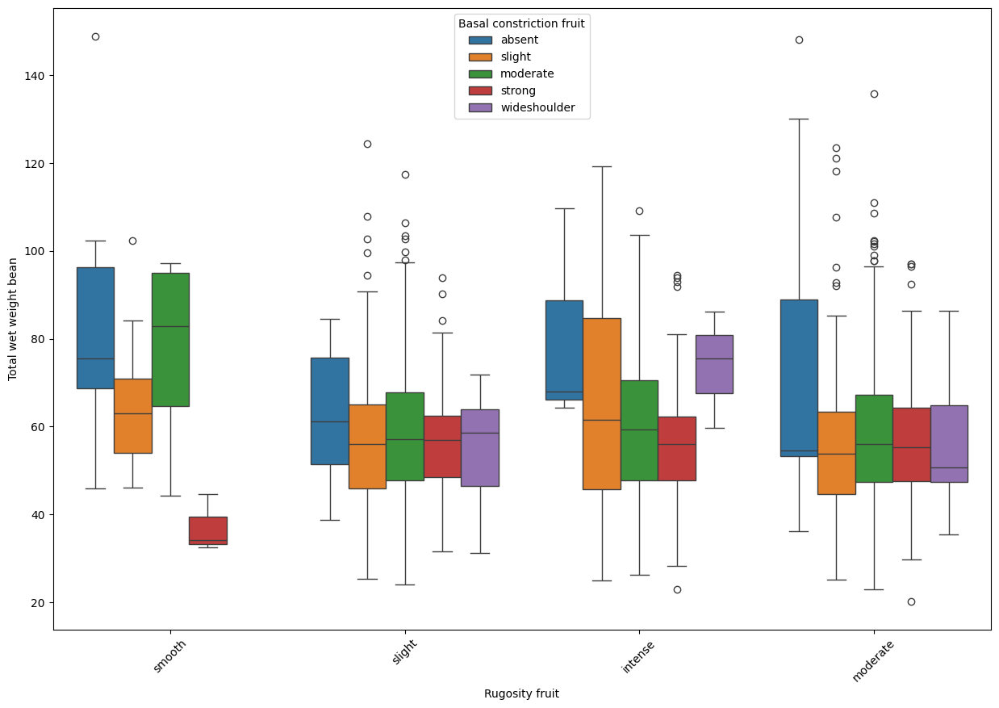

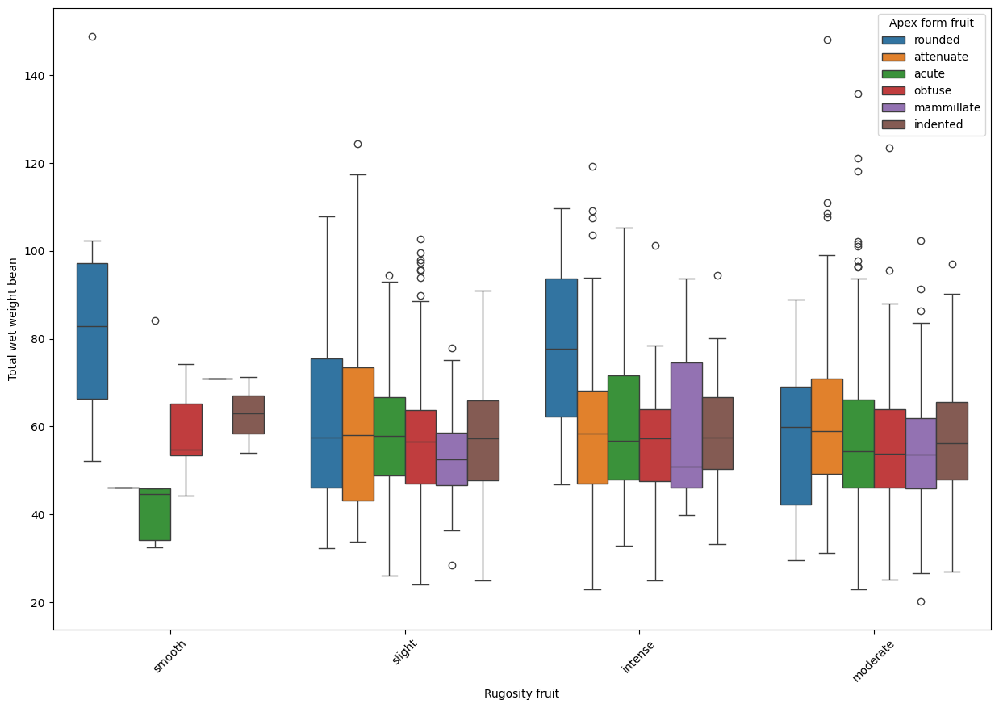

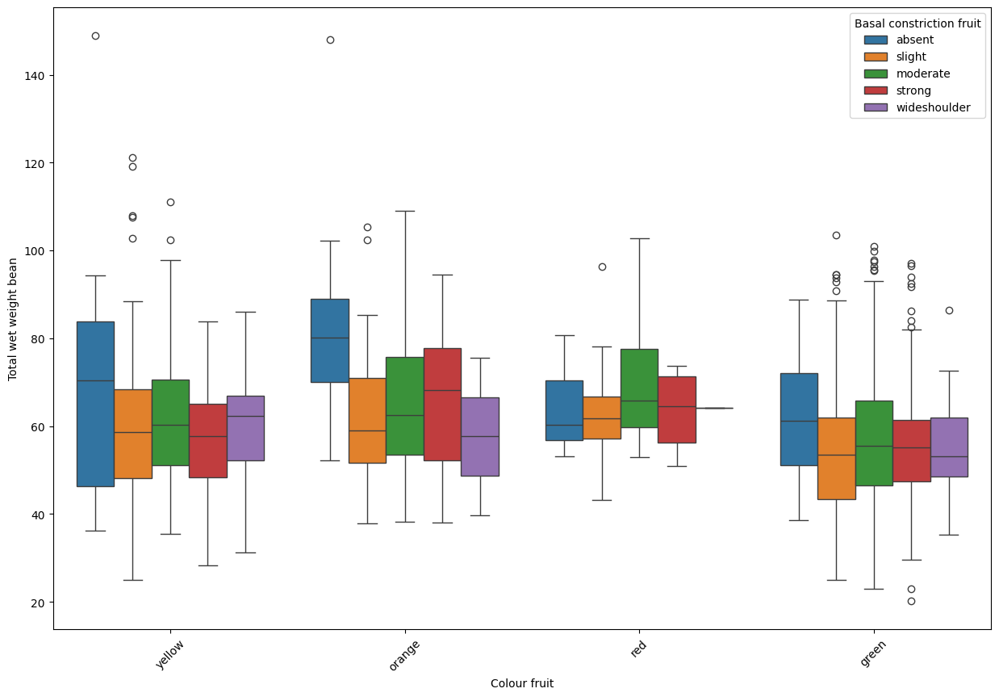

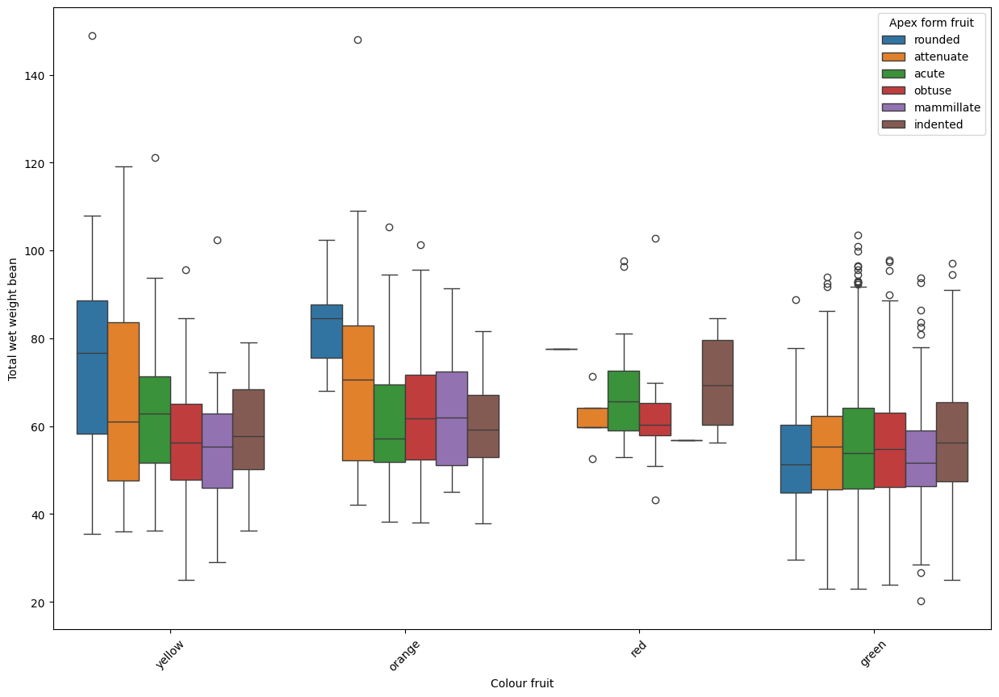

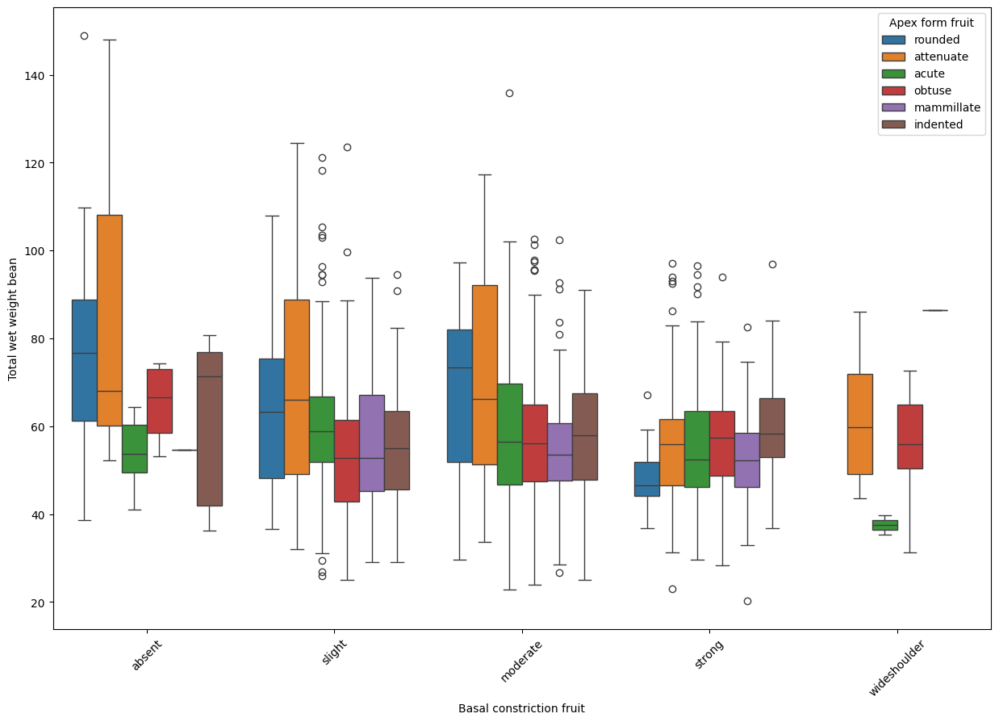

In [ ]:
# Displaying the boxplots

for pair in combinations:
  plt.figure(figsize=(15,10))
  plt.xticks(rotation=45)
  sns.boxplot(data=df_Analyze, y="Total wet weight bean", x=pair[0], hue=pair[1])

Bla Bla

In [ ]:
# Filter DataFrame for each shape of 'Apex form fruit'
obsute_df = df_Analyze[df_Analyze['Apex form fruit'] == 'obsute']
attenuate_df = df_Analyze[df_Analyze['Apex form fruit'] == 'attenuate']
rounded_df = df_Analyze[df_Analyze['Apex form fruit'] == 'rounded']
acute_df = df_Analyze[df_Analyze['Apex form fruit'] == 'acute']
mammillate_df = df_Analyze[df_Analyze['Apex form fruit'] == 'mammillate']
indented_df = df_Analyze[df_Analyze['Apex form fruit'] == 'indented']

In [ ]:
df_apex_form = [obsute_df, attenuate_df, rounded_df, acute_df, mammillate_df, indented_df]

In [ ]:
Anova_test(attenuate_df, 'Rugosity fruit', 'Total wet weight bean')

ANOVA Test Results:
F-statistic: 0.5158977433300614
p-value: 0.6718698480537306
Fail to reject the null hypothesis. There is not enough evidence to suggest that there are differences in the means of 'Total wet weight' based on Rugosity fruit.


In [ ]:
Anova_test(rounded_df, 'Rugosity fruit', 'Total wet weight bean')

ANOVA Test Results:
F-statistic: 5.884899870859874
p-value: 0.0012415302372915098
Reject the null hypothesis. There is significant evidence to suggest that there are differences in the means of 'Total wet weight' based on Rugosity fruit



Tukey HSD Test Results:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05   
 group1   group2  meandiff p-adj   lower    upper  reject
---------------------------------------------------------
 intense moderate -20.5542 0.4412 -56.5652 15.4569  False
 intense   slight -17.3042 0.4794 -48.9596 14.3513  False
 intense   smooth   7.3179 0.9419 -26.7521  41.388  False
moderate   slight     3.25 0.9746  -17.063  23.563  False
moderate   smooth  27.8721 0.0158   3.9699 51.7743   True
  slight   smooth  24.6221 0.0013   7.9912 41.2531   True
---------------------------------------------------------


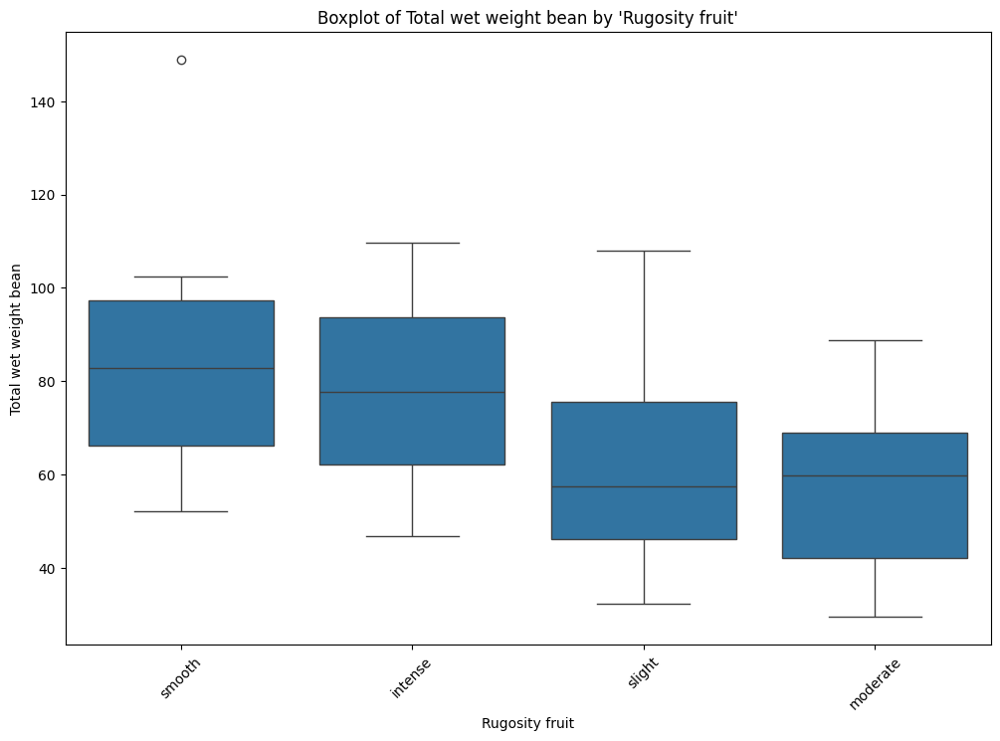

In [ ]:
    plt.figure(figsize=(12, 8))
    plt.xticks(rotation=45)

    # Filter the DataFrame to include only rows with non-null "Total wet weight bean"
    df_filtered = rounded_df.dropna(subset=['Total wet weight bean'])

    # Filter out categorical values that do not have any "Total wet weight bean"
    values_with_data = df_filtered['Rugosity fruit'].unique()

    # Plot the boxplot for filtered data
    sns.boxplot(data=df_filtered[df_filtered['Rugosity fruit'].isin(values_with_data)], x='Rugosity fruit', y="Total wet weight bean")

    plt.title(f"Boxplot of Total wet weight bean by 'Rugosity fruit'")
    plt.show()

In [ ]:
Anova_test(acute_df, 'Rugosity fruit', 'Total wet weight bean')

ANOVA Test Results:
F-statistic: 1.408972538605862
p-value: 0.2393756248912257
Fail to reject the null hypothesis. There is not enough evidence to suggest that there are differences in the means of 'Total wet weight' based on Rugosity fruit.


In [ ]:
Anova_test(mammillate_df, 'Rugosity fruit', 'Total wet weight bean')

ANOVA Test Results:
F-statistic: 1.6610798044051949
p-value: 0.17732366468971386
Fail to reject the null hypothesis. There is not enough evidence to suggest that there are differences in the means of 'Total wet weight' based on Rugosity fruit.


In [ ]:
Anova_test(indented_df, 'Rugosity fruit', 'Total wet weight bean')

ANOVA Test Results:
F-statistic: 0.24925021180297205
p-value: 0.8618728401503503
Fail to reject the null hypothesis. There is not enough evidence to suggest that there are differences in the means of 'Total wet weight' based on Rugosity fruit.


In [ ]:
# Let's call the function


for df in df_apex_form:
    print("DataFrame size:", len(df))
    Anova_test(df, 'Rugosity fruit', 'Total wet weight bean')

DataFrame size: 0


TypeError: at least two inputs are required; got 0.

For feature selection purposes we will load a clean dataset

In [ ]:
df_model=pd.read_csv('data_for_model..csv')

In [ ]:
df_model.info()

In [ ]:
df_model.head(10)

In [ ]:
df_model = df_model.drop(columns='Shape bean_Other')

In [ ]:
from sklearn.tree import DecisionTreeRegressor

def ploting_the_importing_frature_by_decision_tree(data, target):
    # Step 1: Drop the target column
    X = data.drop(target, axis=1)
    y_train = data[target]

    # Step 2: Normalize the data
    sc_data = MinMaxScaler()
    X_train = sc_data.fit_transform(X)

    # Step 3: Train Decision Tree
    model = DecisionTreeRegressor(random_state=42)
    model.fit(X_train, y_train.to_numpy())

    # Step 4: Feature Importance
    feature_importance = model.feature_importances_
    features = X.columns
    Score = pd.DataFrame({'feature': X.columns, 'Spliting score': feature_importance})

    # Step 5: Sort coefficients by absolute value to examine importance
    Score['Spliting score'] = np.abs(Score['Spliting score'])
    Score = Score.sort_values(by='Spliting score', ascending=False)

    # Step 6: Plot Feature Importance for top 12 features
    top_12_features = Score.nlargest(12, 'Spliting score')
    plt.figure(figsize=(10, 8))
    plt.barh(top_12_features['feature'], top_12_features['Spliting score'])
    plt.xlabel('Importance')
    plt.ylabel('Features')
    plt.title('Feature Importance')
    plt.show()



In [ ]:
df_model = df_model.drop(columns='Clone name + Refcode')

In [ ]:
ploting_the_importing_frature_by_decision_tree(df_model,'Total wet weight bean')